# Introduction to Quantum Computing & Quantum Programming

## Lesson 1 - What is Quantum Computing anyway?
## Lesson 2 - Solving a logic puzzle with a Quantum Computer
## Lesson 3 - Coding the puzzle
## Lesson 4 - Solving the puzzle on a real Quantum Computer
## Lesson 5 - A brief detour into computational complexity

# Lesson 1 - What is Quantum Computing Anyway?

## Computing using Classical Mechanics

- Represents numbers through the *physical* state of something, such as the angle of a cog
- Uses classical mechanics of forces, to turn gears, to perform computation

![982px-Babbages_Analytical_Engine_1834-1871.jpg](982px-Babbages_Analytical_Engine_1834-1871.jpg)

Source: https://commons.wikimedia.org/wiki/File:Babbages_Analytical_Engine,_1834-1871._(9660574685).jpg
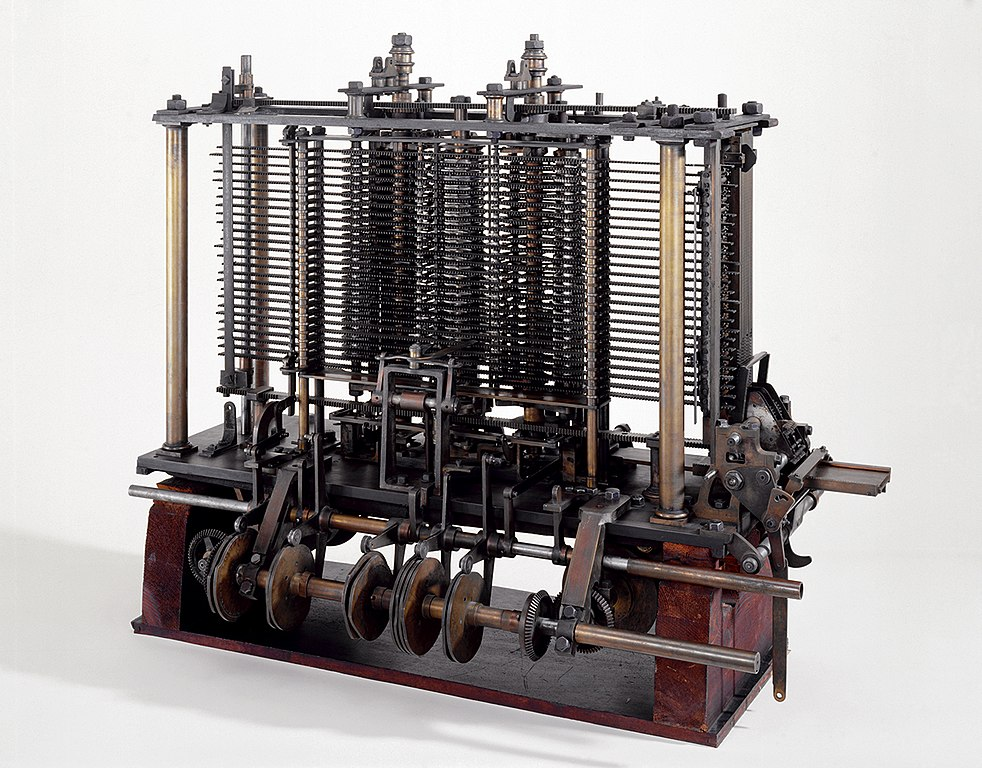

## Computing using Electro-Magnetism

- Represents numbers through the *electrical* state of a semi-conducting material, such as a transistor
- Uses classical electro-magnetism to vary the electrical charges on the transistor to perform computation

![768px-12-inch_silicon_wafer.jpeg](768px-12-inch_silicon_wafer.jpeg)

Source: https://commons.wikimedia.org/wiki/File:12-inch_silicon_wafer.jpg
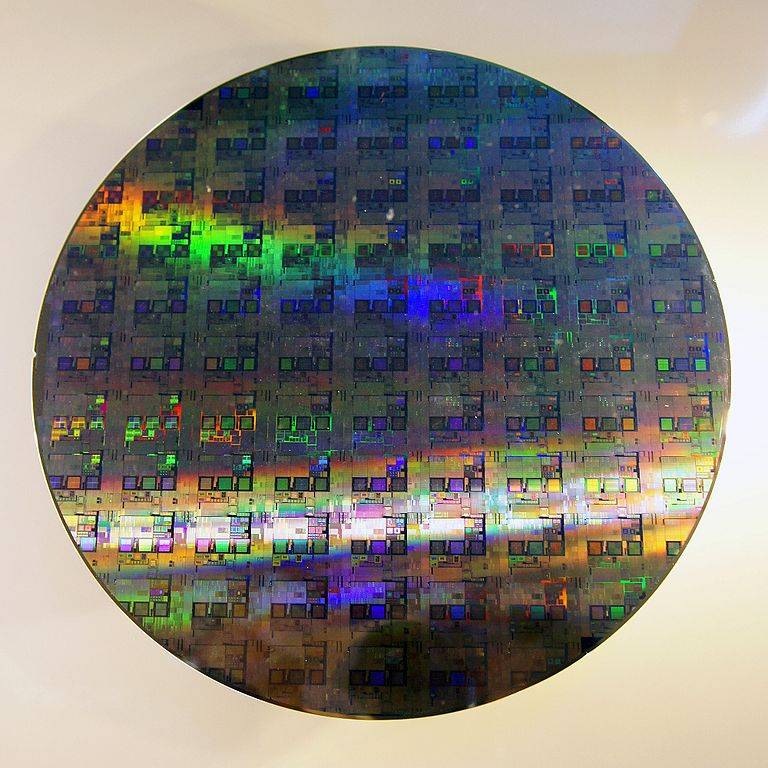

## Computing using Quantum Mechanics

- Represents numbers through the *quantum* state of a sub-atomic particle, such as a photon or electron
- Uses *quantum mechanics* to alter and control the quantum state of the sub-atomic particle to perform computation

Quantum Computing relies on three underlying properties of quantum mechanics:

- Superposition
- Entanglement
- Interference

![IQM_Quantum_Computer_Espoo_Finland.jpeg](IQM_Quantum_Computer_Espoo_Finland.jpeg)

Source: https://commons.wikimedia.org/wiki/File:IQM_Quantum_Computer_Espoo_Finland.jpg

There are two basic forms, or architectures, of Quantum Computers:

- **Gate-based**, also called **universal**
- **Quantum Annealing-based** - specialized for solving optimization problems
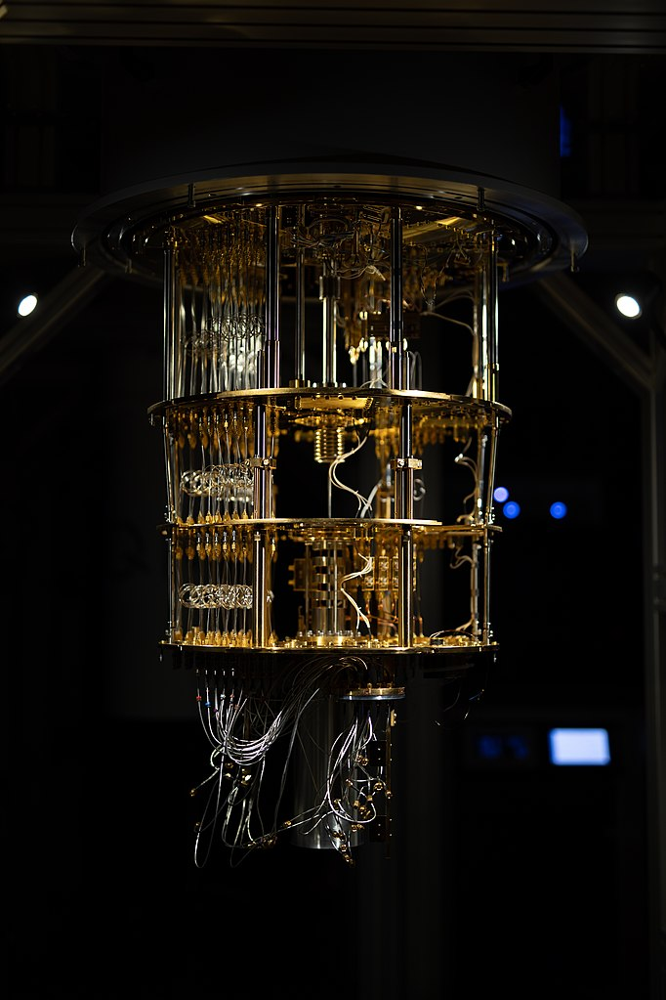

## Why do we care about Quantum Computing?

QCs have the potential to allow us to solve computationally challenging problems that are (and will always be) beyond the reach of classical computers.

# Lesson 2 - Solving a Logic Puzzle with a Quantum Computer

Five children, **Adam**, **Beth**, **Carol**, **Dan** and **Emma**, are invited to a birthday party. Each child wore a different colored t-shirt. One of: **green**, **orange**, **pink**, **red** and **yellow**. After the party, they each got to take a balloon home with them. The balloons were also colored **green**, **orange**, **pink**, **red** and **yellow**.

- Each child made sure that they took a balloon that was different to the color of their t-shirt.
- **Adam** took the **yellow** balloon
- **Carol**'s balloon was **red**
- **Emma** loves her **orange** balloon
- The **green** balloon was taken by **Dan** and is the same color as **Adam**'s t-shirt
- The child wearing the **yellow** t-shirt owns a balloon which is the same color as **Beth**'s t-shirt
- **Carol**'s **pink** t-shirt has a bow on it

Who was was wearing the **red** t-shirt? Who got the **pink** balloon?

## Boolean Satisfiability Problem

This is an example of what is known as a [Boolean satisfiability problem (SAT)](https://en.wikipedia.org/wiki/Boolean_satisfiability_problem). Sudoku is another well-known example of a SAT problem, but these problems arise in industry all the time.

## Problem Structure

Let's set the problem up as a $5 \times 5 \times 5$ array (known mathematically as a *tensor*), with the children, t-shirts and balloons along each of the axes.

A `1` in a particular cell $(i,j,k)$ indicates that child $i$ is wearning t-shirt $j$ and has balloon $k$.

![logic-puzzle-diagram-1.png](logic-puzzle-diagram-1.png)
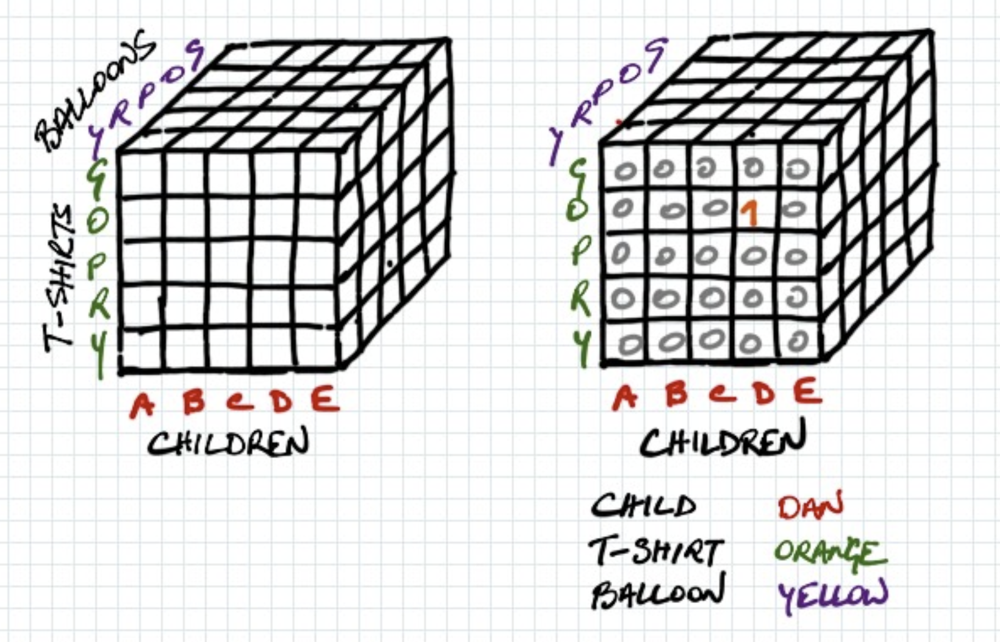

# Lesson 3 - Coding the Puzzle

In [1]:
import sys
sys.path.append("../../../diffq/src")

import diffq as qq  # DiffQ, Mastercard's QC and combinatorics research library
from diffq.constr import sum_eq_1, Axis, Region, Diag, index, Mask, sum_eq_k, vars_eq
from diffq.constr import solve_vars, Linear
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

## Setting up Maps

Let's start by setting up some maps, from names to indices, which will come in handy.

In [2]:
# The children's names
child = {
    'Adam' : 0, 'Beth' : 1, 'Carol' : 2, 'Dan' : 3, 'Emma' : 4
}

# The initials of the t-shirts and balloons
tshirt = balloon = {
    'green' : 0, 'orange' : 1, 'pink' : 2, 'red' : 3, 'yellow' : 4    
}

# The axes on the tensor that we're about to setup that corresponds to each of the dimensions of the problem
axis = {
    'child' : 0, 'tshirt' : 1, 'balloon' : 2
}

Let's start by initializing our Q matrix. As discussed above, we'll need a $5 \times 5 \times 5$ tensor for that.

In [3]:
q_size = len(child)
q = qq.qubo.init_qmat(struct_shape=(q_size, ) * len(axis))

## Global Constraints

Let's start by adding the global constraints. These constraints are expressed as sums across the *slices* of our tensor, which must equal 1. In the diagram below, we've taken a slice of our tensor, which corresponds to all possible assignments of children and their t-shirts to a single balloon (green).

In the example on the left we see one (potentially) valid assignment. On the right, we see an assignment that is definitely not valid, because it is saying that a single balloon can be owned by two separate children.

At this stage, we can only say that the left-most example is *potentially* valid, because we need to check that against all of the other constraints in the puzzle.

![logic-puzzle-diagram-2.png](logic-puzzle-diagram-2.png)

Given that each child can only have one t-shirt and one balloon, the sum of each cross-sectional matrix on every axis of the tensor must be 1.
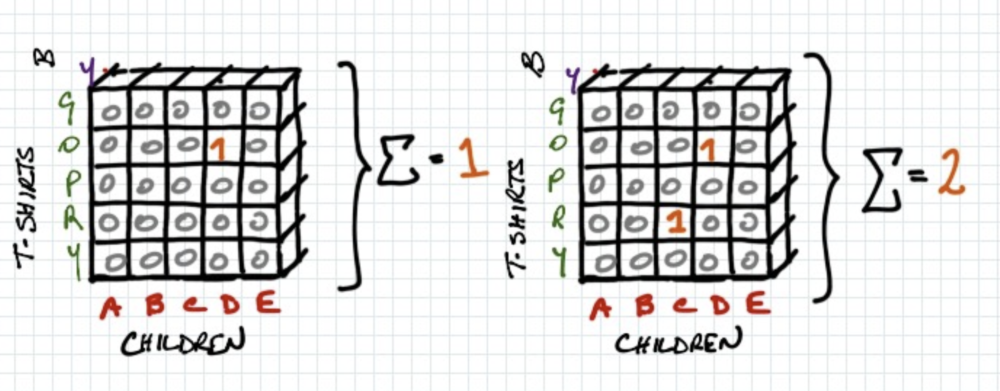

In [4]:
for i in range(len(child)):
    q = qq.qubo.join_constraints(q, constraints=sum_eq_1(index[i]))
    q = qq.qubo.join_constraints(q, constraints=sum_eq_1(index[..., i]))
    q = qq.qubo.join_constraints(q, constraints=sum_eq_1(index[..., ..., i]))

## Second Global Constraint

We also have a second global constraint that the color of a child's t-shirt can't be the same as the child's balloon. Put another way, the diagonal matrices formed by taking slices along axis 0 (children) must be 0.

These constraints are going to be handled differently, because they will be imposed during the variable freezing step at the end. So for now, we're going to accumulate the tensor indices of the entries that are to be set to zero.

In [5]:
mask_0 = Mask(np.stack([np.eye(len(child))]*len(child)))
q = qq.qubo.join_constraints(q, constraints=sum_eq_k(mask_0, 0))

## Local Constraints

OK, let's look at the individual constraints. In many cases, for this puzzle, it will be a matter of putting the `sum_eq_1` constraint on the appropriate region of the constraint tensor.

Here's the first local constraint:

- **Adam** took the **yellow** balloon

<img src='./logic-puzzle-diagram-3.png' alt="Drawing" style="width:600px;">

In [6]:
q = qq.qubo.join_constraints(q, constraints=sum_eq_1(index[child['Adam'], ..., balloon['yellow']]))

- **Carol**'s balloon was **red**

In [7]:
q = qq.qubo.join_constraints(q, constraints=sum_eq_1(index[child['Carol'], ..., balloon['red']]))

- **Emma** loves her **orange** balloon

In [8]:
q = qq.qubo.join_constraints(q, constraints=sum_eq_1(index[child['Emma'], ..., balloon['orange']]))

- The **green** balloon was taken by **Dan** and is the same color as **Adam**'s t-shirt

There are two constraints here: **Dan** took the **green** balloon, and **Adam**'s t-shirt is **green**.

In [9]:
q = qq.qubo.join_constraints(q, constraints=sum_eq_1(index[child['Dan'], ..., balloon['green']]))
q = qq.qubo.join_constraints(q, constraints=sum_eq_1(index[child['Adam'], tshirt['green']]))

- The child wearing the **yellow** t-shirt owns a balloon which is the same color as **Beth**'s t-shirt

This constraint tells us that the **Beth** cannot be wearing the **yellow** t-shirt.

This is different to the constraints that we've seen up to now, because it's only telling us what cannot be. For this constraint, we employ a new function, `sum_eq_k`, which allows us to set the indexed range to an arbitrary value - in this case 0.

In [10]:
# q = qq.qubo.join_constraints(q, constraints=sum_eq_k(index[child['Beth'], tshirt['yellow']], 0))

# The following code is slightly more complex, and is required to implement the more general form of this constraint
for i in range(len(tshirt)):
    mat = np.repeat([-1, 1], len(tshirt))
    
    indices = [index[..., tshirt['yellow'], i], index[child['Beth'], i, ...]]
    indices = map(lambda rr: solve_vars(rr, struct_shape=q.struct_shape), indices)
    indices = np.concatenate(list(indices))
    
    if i == tshirt['yellow']:
        # special handling required here for duplicate variables
        continue
    
    q = qq.qubo.join_constraints(q, Linear(indices, mat_a=mat, vec_b=[0], relation='eq'))

- **Carol**'s **pink** t-shirt has a bow on it

The fact that **Carol**'s t-shirt has a bow is irrelevant here - the key point is that her t-shirt is **pink**.

In [11]:
q = qq.qubo.join_constraints(q, constraints=sum_eq_1(index[child['Carol'], tshirt['pink']]))

# Lesson 4 - Solving on a Quantum Computer

## QUBO Matrix

The D-Wave Quantum Annealer does not accept a 'program' in the way that we typically understand it (source code that has been compiled down to machine code). Rather, it accepts a matrix of numbers, and aims to find a solution to that matrix that has the lowest energy, corresponding to the best solution.

![logic-puzzle-diagram-4.png](logic-puzzle-diagram-4.png)
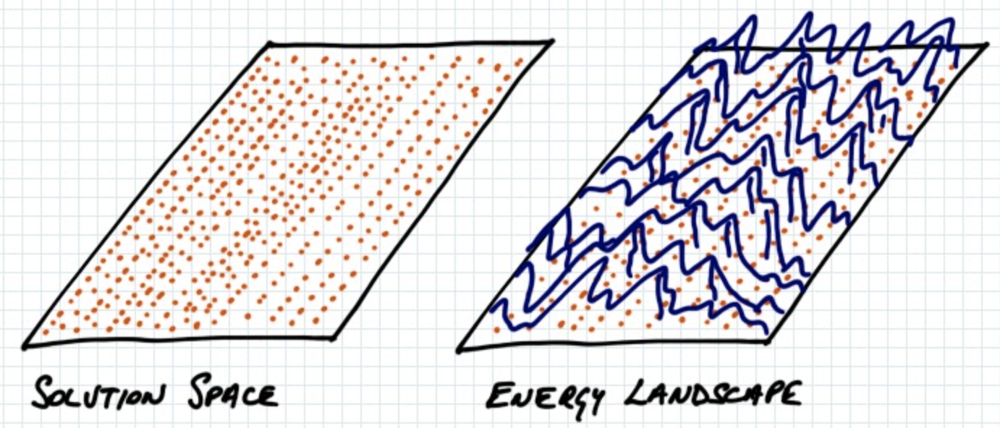

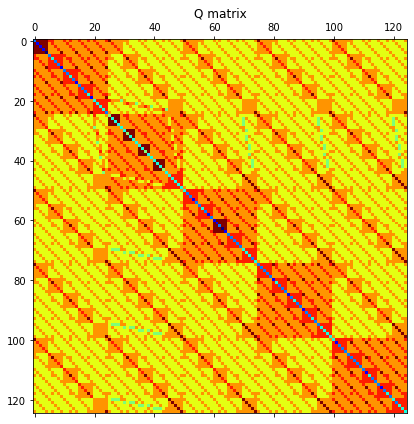

In [12]:
# Plot the Q matrices, note the difference between the original matrix and the
# one where the frozen variables have been applied.

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(10, 6))
axs.set_title('Q matrix')
axs.matshow(qq.qubo.expand_qmat(q).numpy(), cmap='jet')

plt.tight_layout()
plt.show()

In [13]:
qq.qubo.describe(q).style.set_caption('Q matrix stats')

,sparsity,nvars,total_nvars,side_blocks,offset,coeffs,cost_interval
value,0.481280,125.000000,125.000000,0.000000,21.000000,nan,nan
min,nan,nan,nan,nan,nan,-5.000000,-399.000000
max,nan,nan,nan,nan,nan,3.000000,9781.000000


## Submitting the Problem to the Quantum Computer

Before we submit the problem, let's take a quick look at *how* we can access a Quantum Computer today.

![logic-puzzle-diagram-5.png](logic-puzzle-diagram-5.png)

Now, let's submit the problem to the QC to solve the Q matrix.
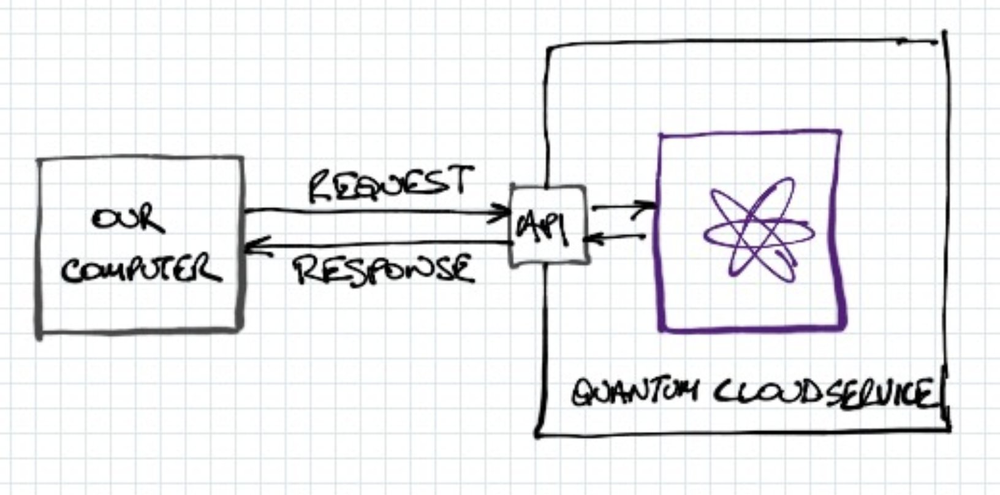

In [14]:
# Submit the problem to D-Wave Quantum Annealer

from dwave.cloud import Client as QAClient
results_id = None 

samples = None
with QAClient.from_config() as client:
    if results_id is None:
        solver = client.get_solver(name='hybrid_binary_quadratic_model_version2')
        results = solver.sample_qubo(qq.qubo.qmat_to_dict(q), time_limit=10)
    else:
        results = client.retrieve_answer(results_id)
    req_id = results.wait_id(timeout=60)
    print(f'Request id: {req_id}')
    samples = np.array(results.samples, dtype=np.bool)

# Take raw results through the library routine that injects the frozen variables
samples = qq.qubo.prepare_solutions(q, x=samples)
samples = samples.x[0].numpy()

Request id: 98e298e1-2784-4f15-b751-dbf45306dbdd


## Retrieving and Analyzing Results

Let's look at the raw results first. Here we see our arrays of results, corresponding to the $5 \times 5 \times 5$ cube we saw above. In this case, each $5 \times 5$ sub-array corresponds to a particular man, each row in each array corresponds to a particular wife, and each column in each array corresponds to a particular pony.

In [15]:
samples

array([[[0., 0., 0., 0., 1.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 1., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0.]]])

Now let's turn those results into something more readable

In [16]:
r_m = {v: k for k, v in child.items()}
r_w = {v: k for k, v in tshirt.items()}
sol1 = map(lambda rr: (r_m[rr[0]], r_w[rr[1]], r_w[rr[2]]), np.stack(np.nonzero(samples)).T)
df = pd.DataFrame(list(sol1), columns=['Child', 'T-Shirt', 'Balloon'])
df

,Child,T-Shirt,Balloon
0,Adam,green,yellow
1,Beth,orange,pink
2,Carol,pink,red
3,Dan,red,green
4,Emma,yellow,orange


## Solution Generated

Let's recap the clues:

- **Adam** took the **yellow** balloon
- **Carol**'s balloon was **red**
- **Emma** loves her **orange** balloon
- The **green** balloon was taken by **Dan** and is the same color as **Adam**'s t-shirt
- The child wearing the **yellow** t-shirt owns a balloon which is the same color as **Beth**'s t-shirt
- **Carol**'s **pink** t-shirt has a bow on it

Who was was wearing the **red** t-shirt? Who got the **pink** balloon?

We can see from visual inspection that all of the constraints have been satisfied.

## Our two questions:

* Who was wearing the **red** t-shirt? **Dan**

In [17]:
df[df['T-Shirt'] == 'red']['Child']

3    Dan
Name: Child, dtype: object

And finally:

* Who got the **pink** balloon? **Beth**

In [18]:
df[df['Balloon'] == 'pink']['Child']

1    Beth
Name: Child, dtype: object

# Lesson 5 - A Brief Detour into Computational Complexity

In our 5 $\times$ 5 $\times$ 5 tensor, there are 125 binary variables. That means, that our tensor can be in any one of $2^{125}$ separate states - only one of which will represent a valid solution.

So one, naive, approach might be to try respresent a candidate solution as being a number between 0 and $2^{125} - 1$, and to try to solve the problem using brute force. That is, to iterate through every possible number in that range, and stop when we have found the right one.

![logic-puzzle-diagram-6.png](logic-puzzle-diagram-6.png)

An example of that might look like the following:
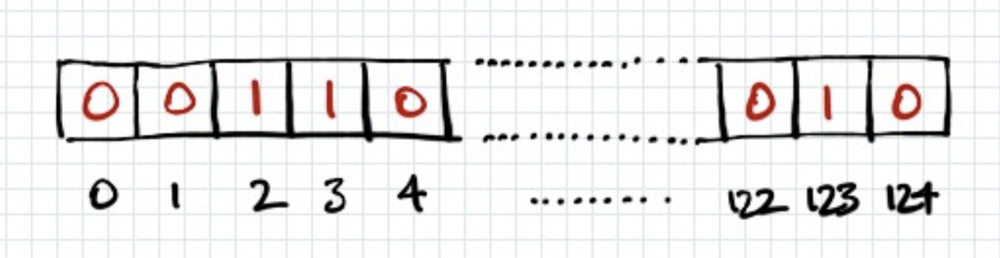

In [19]:
def correct_solution(i):
    # Code to check the correctness of the solution goes here
    return

n = 2**(5 * 5 * 5)
i = 0

while(i < n):
    if(correct_solution(i)):
        print(i)
        break
    i = i+1

KeyboardInterrupt: 

## How many possible states are there?

How big *is* $2^{125}$?

In [20]:
"{:e}".format(2**125)

'4.253530e+37'

In [21]:
2**125

42535295865117307932921825928971026432

Let's assume that we could evaluate 1 state for every clock cycle on a 3GHz computer (3 billion states per second), since the start of time (4.8 billion years), how many states would we be able to examine?

In [22]:
(3 * 10**9) * (4.8 * 10**9) * 365 * 24 * 60 * 60

4.541184e+26

We can see this this number is 11 orders of magnitude (100 billion times) smaller than the total number of states.

So, we would need 100 billion computers, each evaluating 3 billion states a second, all running since the start of time, to visit *each* possible solution.